<a href="https://colab.research.google.com/github/nad369/Cov/blob/main/230704_project_weather_prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import json
import os

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.callbacks import TensorBoard

import numpy as np
import matplotlib.pyplot as plt

import pandas as pd
import h5py, json
import os,time,sys
import math, random

from importlib import reload

In [ ]:
# Spécifiez l'emplacement du fichier CSV et du fichier de description JSON
data_filename = 'donnees-synop-essentielles-omm.csv'


In [ ]:
# Lire les données du fichier CSV
df = pd.read_csv(data_filename, header=0, sep=';')
display(df.tail(10))

,ID OMM station,Date,Pression au niveau mer,Variation de pression en 3 heures,Type de tendance barométrique,Direction du vent moyen 10 mn,Vitesse du vent moyen 10 mn,Température,Point de rosée,Humidité,...,Altitude,communes (name),communes (code),EPCI (name),EPCI (code),department (name),department (code),region (name),region (code),mois_de_l_annee
33589,7535,2017-08-26T16:00:00+01:00,101240.0,-90.0,6.0,210.0,2.1,308.25,289.05,32.0,...,260.0,Gourdon,46127,CC Quercy - Bouriane,244600482.0,Lot,46,Occitanie,76.0,8.0
33590,7661,2017-08-26T16:00:00+01:00,101770.0,-70.0,6.0,170.0,2.3,300.95,294.95,70.0,...,115.0,Saint-Mandrier-sur-Mer,83153,Métropole Toulon-Provence-Méditerranée,248300543.0,Var,83,Provence-Alpes-Côte d'Azur,93.0,8.0
33591,81415,2018-02-27T13:00:00+01:00,101470.0,0.0,NaN,60.0,2.2,298.85,295.75,83.0,...,106.0,Maripasoula,97353,CC de l'Ouest Guyanais,249730037.0,Guyane,973,Guyane,3.0,2.0
33592,7591,2018-02-27T16:00:00+01:00,NaN,-70.0,6.0,210.0,3.3,270.35,258.25,39.0,...,871.0,Embrun,05046,CC Serre-Ponçon,200067742.0,Hautes-Alpes,05,Provence-Alpes-Côte d'Azur,93.0,2.0
33593,61968,2018-02-27T19:00:00+01:00,100950.0,0.0,NaN,70.0,1.2,298.55,297.65,95.0,...,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0
33594,7110,2018-02-27T22:00:00+01:00,101710.0,-70.0,8.0,40.0,2.0,269.65,264.75,69.0,...,94.0,Guipavas,29075,Brest Métropole,242900314.0,Finistère,29,Bretagne,53.0,2.0
33595,61980,2018-02-27T22:00:00+01:00,101240.0,-30.0,7.0,160.0,2.7,299.15,295.05,78.0,...,8.0,Sainte-Marie,97418,CA Intercommunale du Nord de la Réunion (CINOR),249740119.0,La Réunion,974,La Réunion,4.0,2.0
33596,78925,2018-02-27T22:00:00+01:00,101330.0,-80.0,5.0,100.0,6.0,299.15,291.35,62.0,...,3.0,Le Lamentin,97213,CA du Centre de la Martinique,249720061.0,Martinique,972,Martinique,2.0,2.0
33597,7481,2018-02-28T04:00:00+01:00,101380.0,-90.0,8.0,0.0,0.0,263.65,259.05,69.0,...,235.0,Colombier-Saugnieu,69299,CC de l'Est Lyonnais (CCEL),246900575.0,Rhône,69,Auvergne-Rhône-Alpes,84.0,2.0
33598,7661,2018-02-28T07:00:00+01:00,100910.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33599 entries, 0 to 33598
Data columns (total 82 columns):
 #   Column                                                     Non-Null Count  Dtype  
---  ------                                                     --------------  -----  
 0   ID OMM station                                             33599 non-null  int64  
 1   Date                                                       33599 non-null  object 
 2   Pression au niveau mer                                     32126 non-null  float64
 3   Variation de pression en 3 heures                          28211 non-null  float64
 4   Type de tendance barométrique                              27757 non-null  float64
 5   Direction du vent moyen 10 mn                              33085 non-null  float64
 6   Vitesse du vent moyen 10 mn                                33097 non-null  float64
 7   Température                                                33555 non-null  float64
 8   Point 

In [ ]:
print('La forme est : ', df.shape)

La forme est :  (33599, 82)


# suppression des colonnes jugées inutiles

In [ ]:
columns_used = ['Date', 'Pression au niveau mer', 'Variation de pression en 3 heures', 'Type de tendance barométrique', 'Direction du vent moyen 10 mn', 'Vitesse du vent moyen 10 mn', 'Température', 'Point de rosée', 'Humidité', 'Temps présent', 'Pression station', 'Rafales sur une période', 'Periode de mesure de la rafale', 'Précipitations dans la dernière heure', 'Précipitations dans les 3 dernières heures']

In [ ]:
# Supprimer les colonnes inutilisées
to_drop = df.columns.difference(columns_used)
df.drop(to_drop, axis=1, inplace=True)

# Afficher tout cela
print('Nos colonnes sélectionnées :')
display(df.head(20))

Nos colonnes sélectionnées :


,Date,Pression au niveau mer,Variation de pression en 3 heures,Type de tendance barométrique,Direction du vent moyen 10 mn,Vitesse du vent moyen 10 mn,Température,Point de rosée,Humidité,Temps présent,Pression station,Rafales sur une période,Periode de mesure de la rafale,Précipitations dans la dernière heure,Précipitations dans les 3 dernières heures
0,2013-04-03T16:00:00+01:00,101460.0,NaN,NaN,40.0,7.2,302.75,293.85,59.0,2.0,101370.0,NaN,NaN,NaN,0.0
1,2013-04-03T19:00:00+01:00,101180.0,-40.0,7.0,20.0,5.7,277.15,272.75,73.0,0.0,100350.0,12.9,-10.0,0.0,0.0
2,2013-04-03T19:00:00+01:00,100890.0,20.0,3.0,70.0,7.7,278.25,271.15,60.0,0.0,96760.0,12.3,-10.0,0.0,0.0
3,2013-04-03T19:00:00+01:00,100350.0,-100.0,6.0,170.0,1.5,286.75,281.95,73.0,0.0,99830.0,2.6,-10.0,0.0,0.0
4,2013-04-03T22:00:00+01:00,100950.0,100.0,1.0,30.0,10.3,276.95,271.75,69.0,NaN,100420.0,15.9,-10.0,0.0,0.0
5,2013-04-03T22:00:00+01:00,100670.0,50.0,3.0,30.0,5.1,278.85,269.25,50.0,0.0,99210.0,7.7,-10.0,0.0,0.0
6,2013-04-03T22:00:00+01:00,100490.0,10.0,0.0,50.0,4.1,278.85,269.25,50.0,0.0,95680.0,7.2,-10.0,0.0,0.0
7,2013-04-03T22:00:00+01:00,100140.0,-30.0,7.0,70.0,1.0,282.85,277.85,71.0,0.0,95870.0,2.1,-10.0,0.0,0.0
8,2013-04-03T22:00:00+01:00,101260.0,NaN,NaN,150.0,1.0,296.65,292.35,77.0,NaN,101190.0,NaN,NaN,NaN,NaN
9,2013-04-03T22:00:00+01:00,101550.0,-90.0,6.0,80.0,5.7,300.25,293.85,68.0,NaN,101100.0,NaN,NaN,NaN,NaN


# Remplacement des noms des colonnes par leurs abreviations

In [ ]:
df = df.rename(columns={
    'Date': 'date',
    'Pression au niveau mer': 'pmer',
    'Variation de pression en 3 heures': 'tend',
    'Type de tendance barométrique': 'cod_tend',
    'Direction du vent moyen 10 mn': 'dd',
    'Vitesse du vent moyen 10 mn': 'ff',
    'Point de rosée': 'td',
    'Humidité':'u',
    'Temps présent': 'ww',
    'Pression station': 'press',
    'Rafales sur une période': 'rafper',
    'Periode de mesure de la rafale': 'per',
    'Précipitations dans la dernière heure': 'rr1',
    'Précipitations dans les 3 dernières heures': 'rr3',
    'Température': 'tc',

})

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33599 entries, 0 to 33598
Data columns (total 15 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   date      33599 non-null  object 
 1   pmer      32126 non-null  float64
 2   tend      28211 non-null  float64
 3   cod_tend  27757 non-null  float64
 4   dd        33085 non-null  float64
 5   ff        33097 non-null  float64
 6   tc        33555 non-null  float64
 7   td        33460 non-null  float64
 8   u         33437 non-null  float64
 9   ww        25608 non-null  float64
 10  press     29631 non-null  float64
 11  rafper    27737 non-null  float64
 12  per       27758 non-null  float64
 13  rr1       28187 non-null  float64
 14  rr3       29009 non-null  float64
dtypes: float64(14), object(1)
memory usage: 3.8+ MB


In [ ]:
df.describe()

,pmer,tend,cod_tend,dd,ff,tc,td,u,ww,press,rafper,per,rr1,rr3
count,32126.000000,28211.000000,27757.000000,33085.000000,33097.000000,33555.000000,33460.000000,33437.000000,25608.000000,29631.000000,27737.000000,27758.000000,28187.000000,29009.000000
mean,101520.536014,0.950693,4.310084,176.414085,4.059948,287.752208,283.017331,75.674283,8.165690,99777.551213,7.357486,-10.556596,0.089733,0.324961
std,906.617518,122.387264,2.716422,107.778562,3.165123,9.444027,9.083263,16.891519,18.234857,2409.413817,5.020028,4.805173,0.610109,1.599424
min,95090.000000,-1370.000000,0.000000,0.000000,0.000000,241.950000,224.850000,1.000000,0.000000,41760.000000,0.000000,-60.000000,-0.100000,-0.100000
25%,101120.000000,-70.000000,2.000000,80.000000,1.800000,281.250000,277.450000,65.000000,0.000000,98990.000000,3.700000,-10.000000,0.000000,0.000000
50%,101540.000000,0.000000,3.000000,180.000000,3.200000,287.550000,282.950000,78.000000,2.000000,100500.000000,6.200000,-10.000000,0.000000,0.000000
75%,102050.000000,70.000000,7.000000,270.000000,5.700000,295.750000,289.050000,90.000000,2.000000,101260.000000,9.700000,-10.000000,0.000000,0.000000
max,104280.000000,2170.000000,8.000000,360.000000,31.400000,318.150000,371.950000,100.000000,95.000000,104020.000000,48.400000,-10.000000,26.000000,50.000000


In [ ]:
df.head()

,date,pmer,tend,cod_tend,dd,ff,tc,td,u,ww,press,rafper,per,rr1,rr3
0,2013-04-03T16:00:00+01:00,101460.0,NaN,NaN,40.0,7.2,302.75,293.85,59.0,2.0,101370.0,NaN,NaN,NaN,0.0
1,2013-04-03T19:00:00+01:00,101180.0,-40.0,7.0,20.0,5.7,277.15,272.75,73.0,0.0,100350.0,12.9,-10.0,0.0,0.0
2,2013-04-03T19:00:00+01:00,100890.0,20.0,3.0,70.0,7.7,278.25,271.15,60.0,0.0,96760.0,12.3,-10.0,0.0,0.0
3,2013-04-03T19:00:00+01:00,100350.0,-100.0,6.0,170.0,1.5,286.75,281.95,73.0,0.0,99830.0,2.6,-10.0,0.0,0.0
4,2013-04-03T22:00:00+01:00,100950.0,100.0,1.0,30.0,10.3,276.95,271.75,69.0,NaN,100420.0,15.9,-10.0,0.0,0.0


# Génération du rapport pandas profiling pour plus de visibilité

In [ ]:
!pip install pandas-profiling

In [ ]:
!pip install --upgrade pandas-profiling

In [ ]:
!pip install --upgrade matplotlib

In [ ]:
import pandas_profiling as pp

# Generate the profile report
Profile = pp.ProfileReport(df, title='Pandas Profiling Report')

# Display the report
Profile.to_notebook_iframe()

<ipython-input-204-26c78acbc004>:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling as pp


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# le rapport pandas profiling indique des données manquants

In [ ]:
# ---- Count the na values by columns
#
dataset_na = df.isna().sum().tolist()
dataset_cols = df.columns.tolist()

# ---- Show all of that
#
df_desc = pd.DataFrame({'Columns': dataset_cols, 'Na': dataset_na})
display(df_desc.style.set_properties(**{'text-align': 'left'}))

,Columns,Na
0,date,0
1,pmer,1473
2,tend,5388
3,cod_tend,5842
4,dd,514
5,ff,502
6,tc,44
7,td,139
8,u,162
9,ww,7991


# trions notre data et concoctons les valeurs NaN avec une interpolation

In [ ]:
# ---- First of all, we have to sort on the date

df.sort_values(['date'],  inplace=True)
df.reset_index(drop=True, inplace=True)

# ---- Before : Lines with NaN

na_rows=df.isna().any(axis=1)
display( df[na_rows].head(10) )

# ---- Nice interpolation for plugging holes

df.interpolate(inplace=True)

# ---- After
display(df[na_rows].head(10))

,date,pmer,tend,cod_tend,dd,ff,tc,td,u,ww,press,rafper,per,rr1,rr3
3,2010-01-01T07:00:00+01:00,NaN,-140.0,6.0,20.0,5.1,276.65,273.15,78.0,0.0,88810.0,8.7,-10.0,0.0,0.0
11,2010-01-01T19:00:00+01:00,100930.0,NaN,NaN,280.0,2.1,301.05,297.65,82.0,NaN,NaN,6.2,-10.0,0.0,NaN
14,2010-01-02T01:00:00+01:00,101220.0,NaN,NaN,40.0,2.6,298.75,295.65,83.0,2.0,101130.0,NaN,NaN,NaN,0.0
17,2010-01-02T04:00:00+01:00,101420.0,-20.0,8.0,50.0,2.6,297.25,296.05,93.0,25.0,NaN,NaN,NaN,NaN,NaN
18,2010-01-02T04:00:00+01:00,NaN,200.0,2.0,340.0,1.5,270.25,267.25,77.0,NaN,91520.0,5.1,-10.0,0.0,0.0
28,2010-01-02T22:00:00+01:00,101960.0,40.0,1.0,210.0,4.1,273.25,271.35,87.0,NaN,100990.0,7.2,-10.0,0.0,0.0
29,2010-01-02T22:00:00+01:00,102190.0,40.0,3.0,210.0,1.5,272.75,270.35,82.0,NaN,100770.0,4.6,-10.0,0.0,0.0
30,2010-01-02T22:00:00+01:00,101070.0,-20.0,5.0,100.0,6.2,298.25,296.45,90.0,NaN,100770.0,NaN,NaN,NaN,NaN
31,2010-01-03T01:00:00+01:00,101840.0,-190.0,8.0,100.0,4.6,276.75,273.25,78.0,NaN,101100.0,7.7,-10.0,0.0,0.0
32,2010-01-03T01:00:00+01:00,102210.0,20.0,1.0,160.0,0.5,273.15,270.75,84.0,NaN,100790.0,7.2,-10.0,0.0,0.0


,date,pmer,tend,cod_tend,dd,ff,tc,td,u,ww,press,rafper,per,rr1,rr3
3,2010-01-01T07:00:00+01:00,99430.0,-140.0,6.0,20.0,5.1,276.65,273.15,78.0,0.0,88810.0,8.70,-10.0,0.0,0.0
11,2010-01-01T19:00:00+01:00,100930.0,180.0,1.5,280.0,2.1,301.05,297.65,82.0,30.0,100005.0,6.20,-10.0,0.0,2.5
14,2010-01-02T01:00:00+01:00,101220.0,280.0,1.0,40.0,2.6,298.75,295.65,83.0,2.0,101130.0,9.00,-10.0,0.0,0.0
17,2010-01-02T04:00:00+01:00,101420.0,-20.0,8.0,50.0,2.6,297.25,296.05,93.0,25.0,96240.0,4.10,-10.0,0.0,0.0
18,2010-01-02T04:00:00+01:00,101525.0,200.0,2.0,340.0,1.5,270.25,267.25,77.0,13.5,91520.0,5.10,-10.0,0.0,0.0
28,2010-01-02T22:00:00+01:00,101960.0,40.0,1.0,210.0,4.1,273.25,271.35,87.0,2.0,100990.0,7.20,-10.0,0.0,0.0
29,2010-01-02T22:00:00+01:00,102190.0,40.0,3.0,210.0,1.5,272.75,270.35,82.0,2.0,100770.0,4.60,-10.0,0.0,0.0
30,2010-01-02T22:00:00+01:00,101070.0,-20.0,5.0,100.0,6.2,298.25,296.45,90.0,2.0,100770.0,6.15,-10.0,0.0,0.0
31,2010-01-03T01:00:00+01:00,101840.0,-190.0,8.0,100.0,4.6,276.75,273.25,78.0,2.0,101100.0,7.70,-10.0,0.0,0.0
32,2010-01-03T01:00:00+01:00,102210.0,20.0,1.0,160.0,0.5,273.15,270.75,84.0,2.0,100790.0,7.20,-10.0,0.0,0.0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33599 entries, 0 to 33598
Data columns (total 15 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   date      33599 non-null  object 
 1   pmer      33599 non-null  float64
 2   tend      33599 non-null  float64
 3   cod_tend  33599 non-null  float64
 4   dd        33599 non-null  float64
 5   ff        33599 non-null  float64
 6   tc        33599 non-null  float64
 7   td        33599 non-null  float64
 8   u         33599 non-null  float64
 9   ww        33599 non-null  float64
 10  press     33599 non-null  float64
 11  rafper    33599 non-null  float64
 12  per       33599 non-null  float64
 13  rr1       33599 non-null  float64
 14  rr3       33599 non-null  float64
dtypes: float64(14), object(1)
memory usage: 3.8+ MB


In [ ]:
date = df[date_time_key]
print(date.is_unique)
print(date.is_monotonic_increasing)

False
True


# Aussi, il y a lieu d'encoder encoder la colonne "date"

# enregistriment

In [ ]:
# Convertir la colonne de temps en objet datetime

df['date'] = pd.to_datetime(df['date'])

# Extraire les caractéristiques temporelles
df['year'] = df['date'].dt.year
df['month'] = df['date'].dt.month
df['day'] = df['date'].dt.day
df['hour'] = df['date'].dt.hour

# Afficher les premières lignes du DataFrame modifié
print(df.head())

In [ ]:
import os

# Définir les chemins des fichiers de sortie
output_dir = '/content' # Répertoire de sortie
dataset_filename = 'dataset.csv' # Nom du fichier de données

# Créer le répertoire de sortie s'il n'existe pas
os.makedirs(output_dir, exist_ok=True)
print('Output directory :', output_dir)

# Enregistrer les données dans un fichier CSV
filedata = f'{output_dir}/{dataset_filename}'
df.to_csv(filedata, sep=';', index=False)
size = os.path.getsize(filedata) / (1024 * 1024)
print(f'Dataset saved. ({size:0.1f} Mo)')

Output directory : /content
Dataset saved. (3.4 Mo)


In [ ]:
from google.colab import files

# Télécharger le fichier CSV
files.download(filedata)

# Télécharger le fichier JSON
files.download(filedesc)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Vizualisation : traçage de données d’une tranche aléatoire de 240 lignes soit un mois

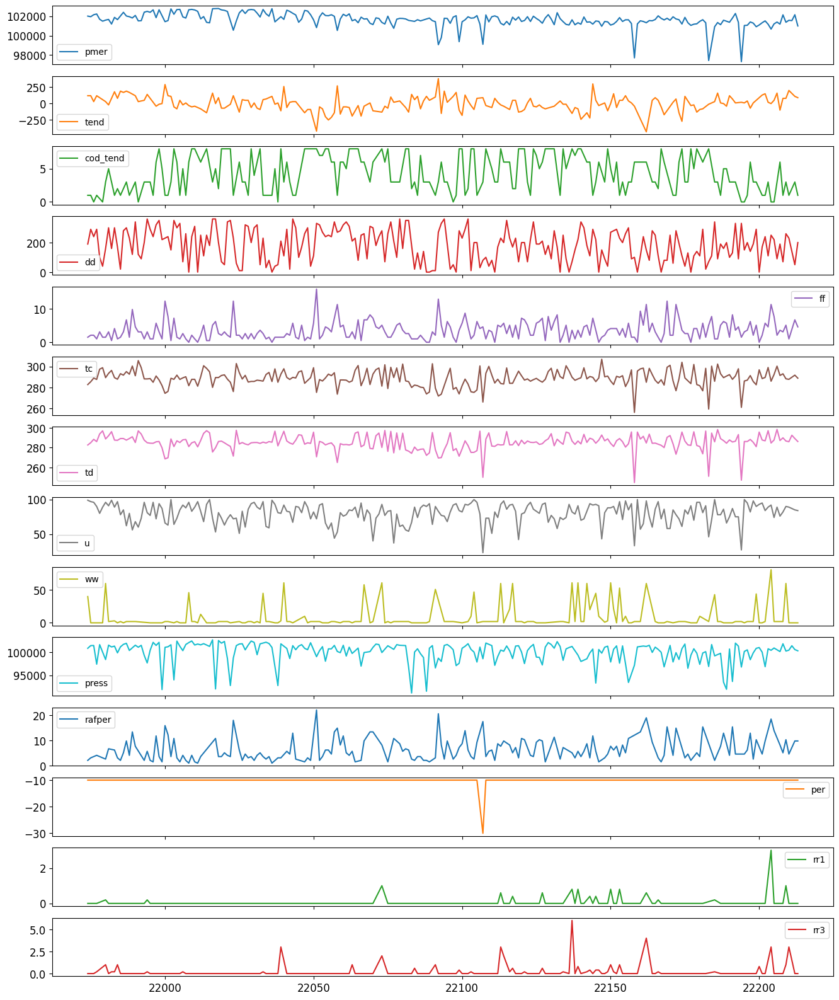

In [ ]:
import matplotlib.pyplot as plt
import random

i = random.randint(0, len(df) - 240)
df.iloc[i:i+240].plot(subplots=True, fontsize=12, figsize=(16,20))
plt.savefig('01-one-month.png')
plt.show()

# Pour avoir une idée sur le comportement des données avec lesquelles nous travaillons, chaque fonctionnalité a été tracée ci-dessous. Cela montre la tendance distincte de chaque features.

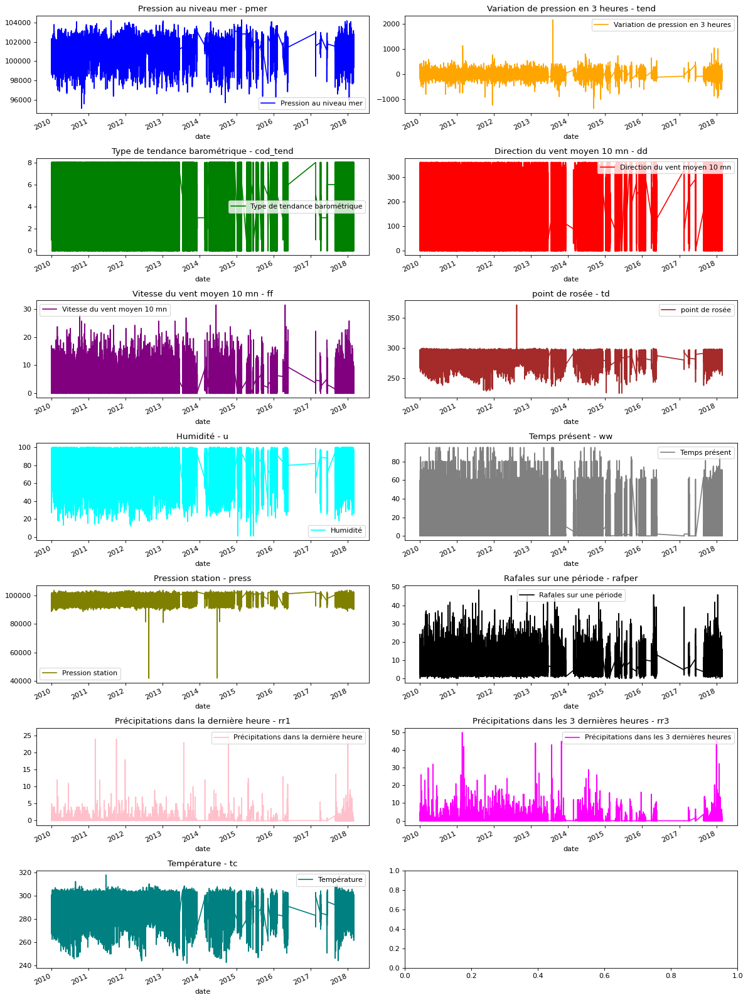

In [ ]:
titles = [

    "Pression au niveau mer",
    "Variation de pression en 3 heures",
    "Type de tendance barométrique",
    "Direction du vent moyen 10 mn",
    "Vitesse du vent moyen 10 mn",
    "point de rosée",
    "Humidité",
    "Temps présent",
    "Pression station",
    "Rafales sur une période",
    "Précipitations dans la dernière heure",
    "Précipitations dans les 3 dernières heures",
    "Température",
]

feature_keys = [

    "pmer",
    "tend",
    "cod_tend",
    "dd",
    "ff",
    "td",
    "u",
    "ww",
    "press",
    "rafper",
    "rr1",
    "rr3",
    "tc",

]

colors = [
    "blue",
    "orange",
    "green",
    "red",
    "purple",
    "brown",
    "cyan",
    "gray",
    "olive",
    "black",
    "pink",
    "magenta",
    "teal",
    "maroon",
]

date_time_key = "date"


def show_raw_visualization(data):
    date = df[date_time_key]
    fig, axes = plt.subplots(
        nrows=7, ncols=2, figsize=(15, 20), dpi=80, facecolor="w", edgecolor="k"
    )
    for i in range(len(feature_keys)):
        key = feature_keys[i]
        c = colors[i % (len(colors))]
        t_data = data[key]
        t_data.index = date
        t_data.head()
        ax = t_data.plot(
            ax=axes[i // 2, i % 2],
            color=c,
            title="{} - {}".format(titles[i], key),
            rot=25,
        )
        ax.legend([titles[i]])
    plt.tight_layout()


show_raw_visualization(df)

# Matrice de corrélation (déjà générée dans la rapport pandas profiling) pour afficher la corrélation entre les différentes caractéristiques

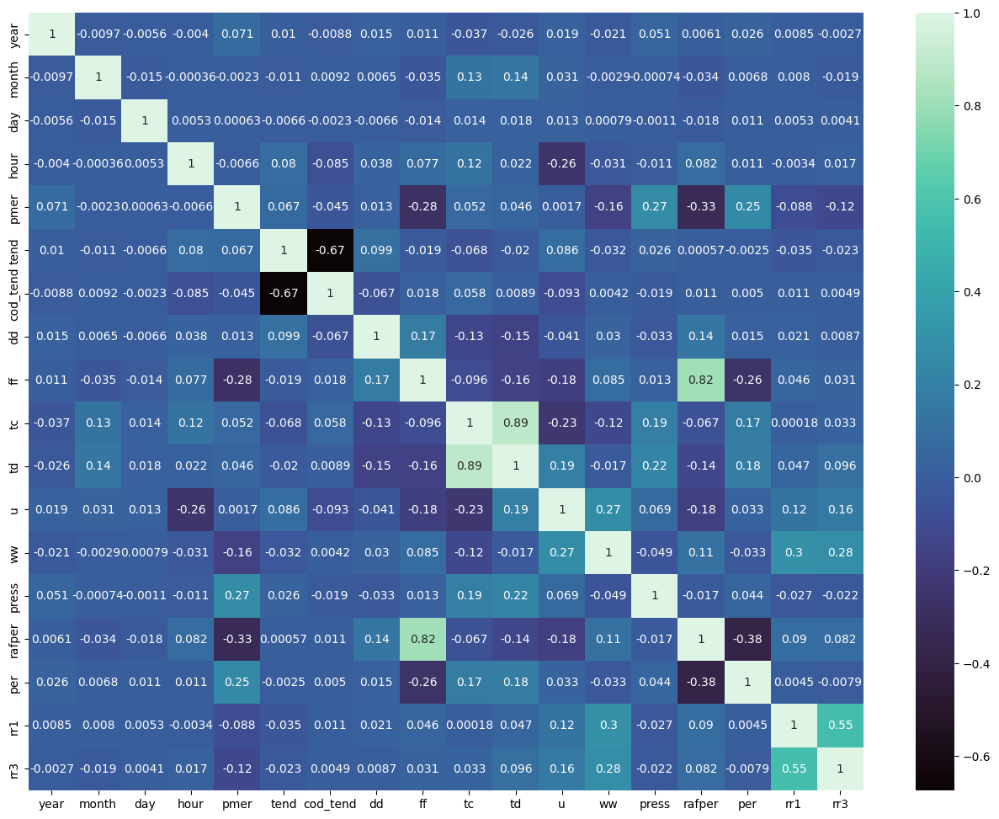

In [ ]:
import seaborn as sns
cor = df.corr(numeric_only=True)
plt.figure(figsize=(16,12))
sns.heatmap(cor,annot=True,cmap='mako')
plt.show()

# Nous observons ici de fortes corrélations entre:  
- temperature (tc) et Point de rosée (td)
- Vitesse du vent moyen 10 mn(ff) et Rafales sur une période (rafper)
- Variation de pression en 3 heures (tend) et Type de tendance barométrique (cod_tend)

et à moindre degré :

- Précipitations dans la dernière heure (rr1) et Précipitations dans les 3 dernières heures (rr3)

'Pression au niveau mer': 'pmer',
    'Variation de pression en 3 heures': 'tend',
    'Type de tendance barométrique': 'cod_tend',
    'Direction du vent moyen 10 mn': 'dd',
    'Vitesse du vent moyen 10 mn': 'ff',
    'Point de rosée': 'td',
    'Humidité':'u',
    'Temps présent': 'ww',
    'Pression station': 'press',
    'Rafales sur une période': 'rafper',
    'Periode de mesure de la rafale': 'per',
    'Précipitations dans la dernière heure': 'rr1',
    'Précipitations dans les 3 dernières heures': 'rr3',
    'Température': 'tc',

# Create a scatter plot to show the relationship between temperature and relativehumidity

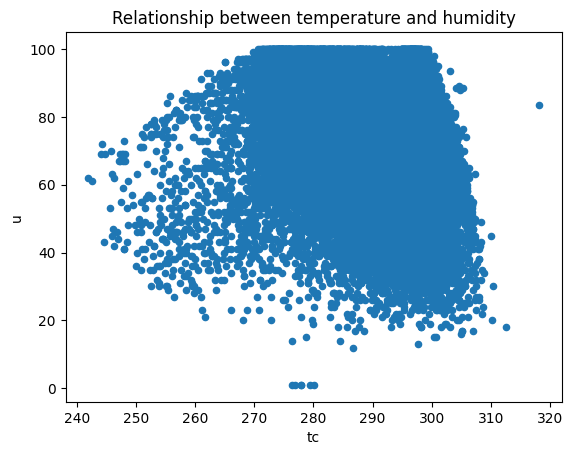

In [ ]:
df.plot(kind='scatter', x='tc', y='u')
plt.title('Relationship between temperature and humidity')
plt.xlabel('tc')
plt.ylabel('u')
plt.show()

# Create a scatter plot to show the relationship between temperture and others features

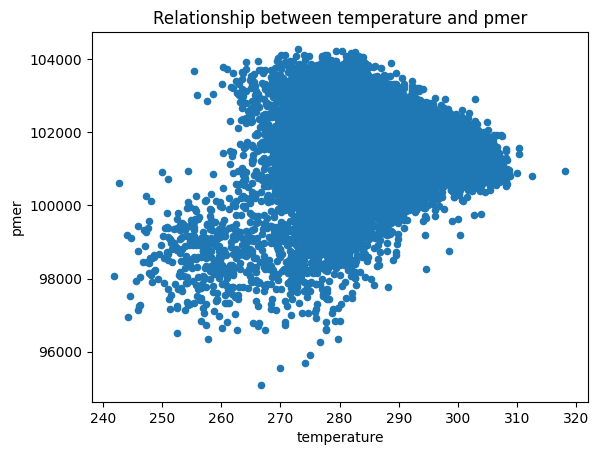

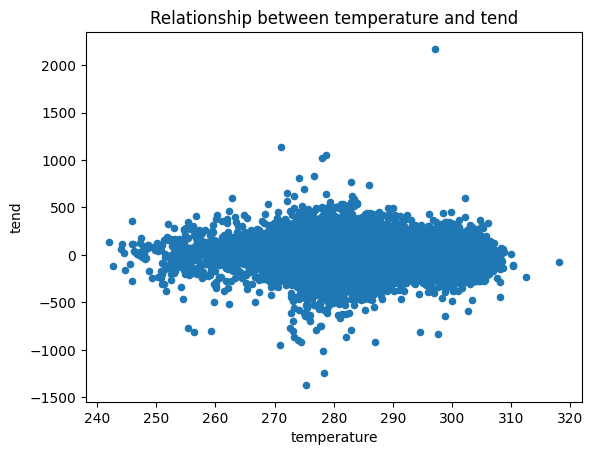

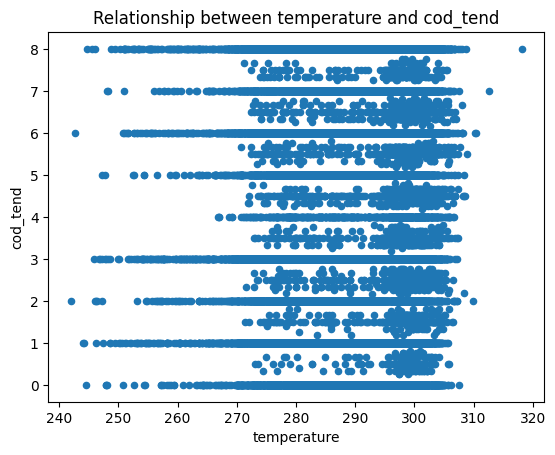

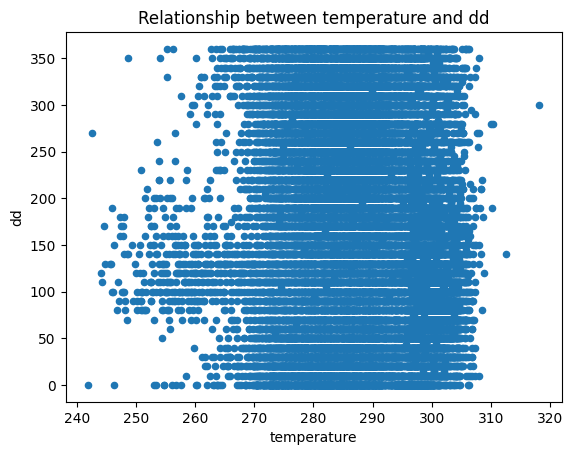

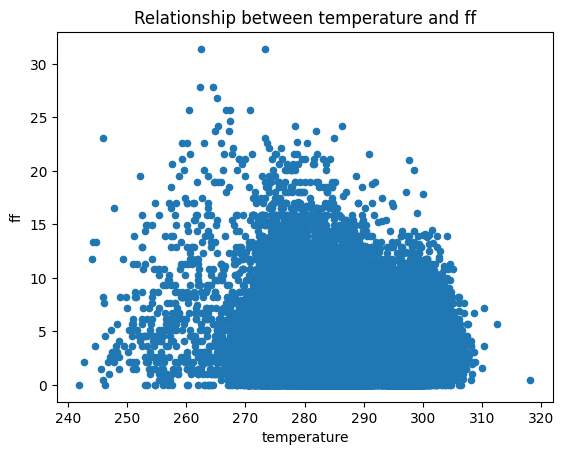

...

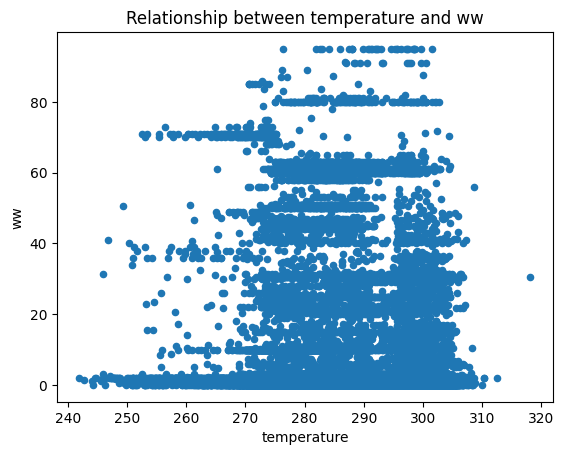

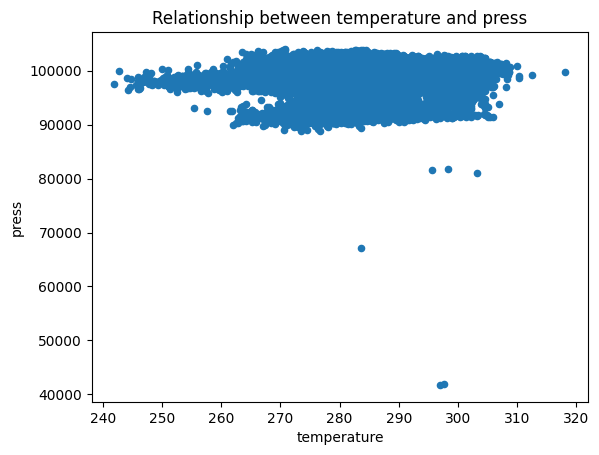

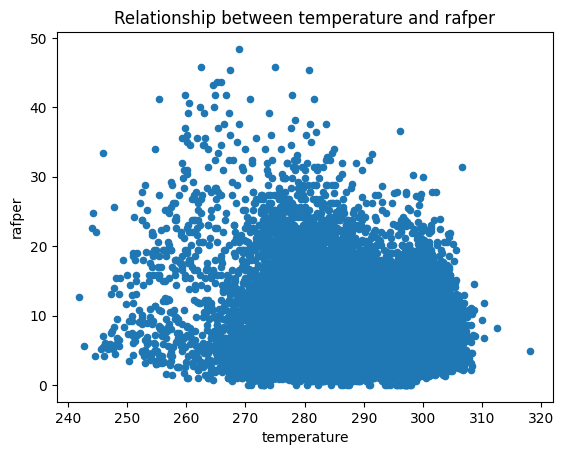

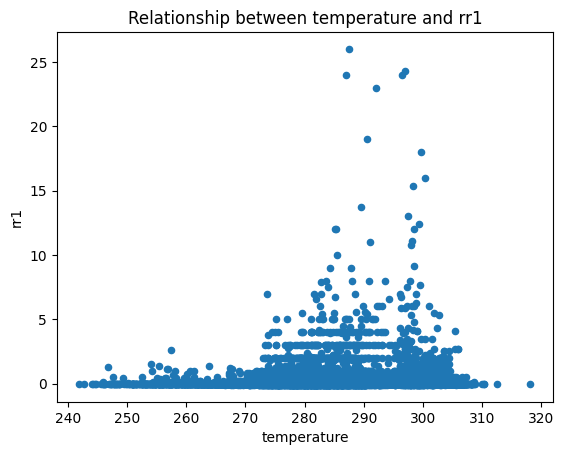

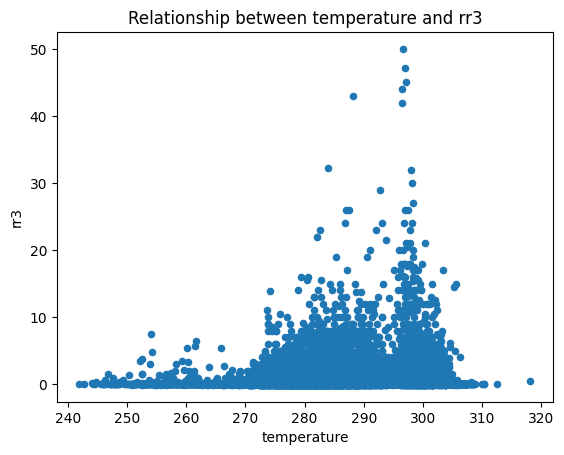

In [ ]:
features = [

    "pmer",
    "tend",
    "cod_tend",
    "dd",
    "ff",
    "td",
    "ww",
    "press",
    "rafper",
    "rr1",
    "rr3",

]

for feature in features:
    df.plot(kind='scatter', x='tc', y=feature)
    plt.title(f'Relationship between temperature and {feature}')
    plt.xlabel('temperature')
    plt.ylabel(feature)
    plt.show()

# Create a scatter plot to show the relationship between humidity and others features

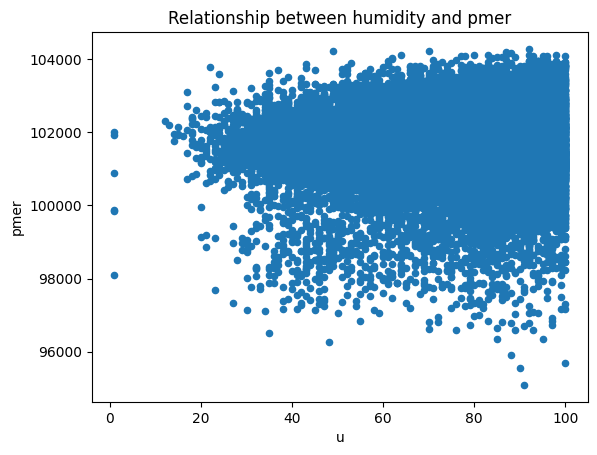

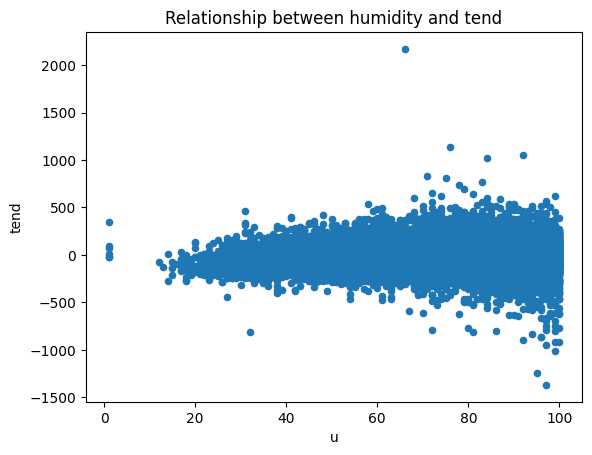

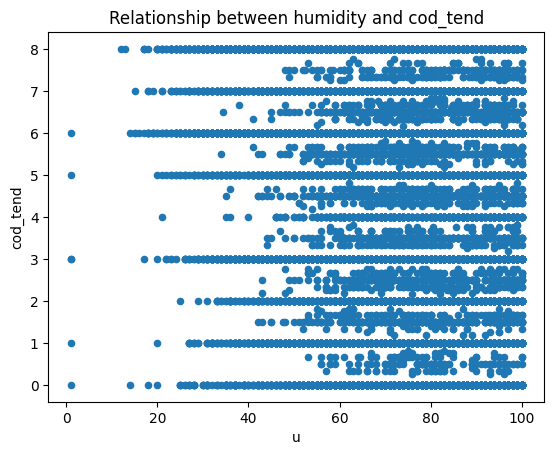

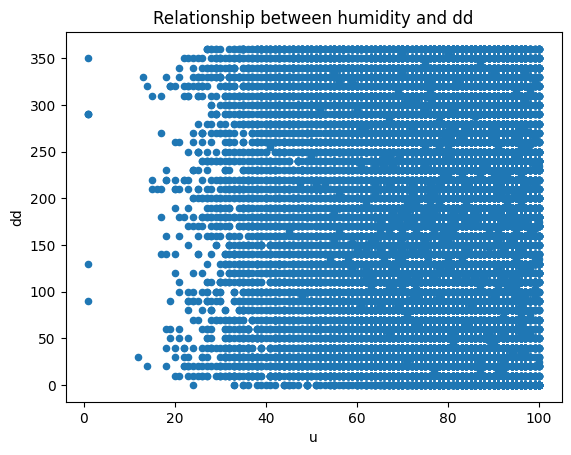

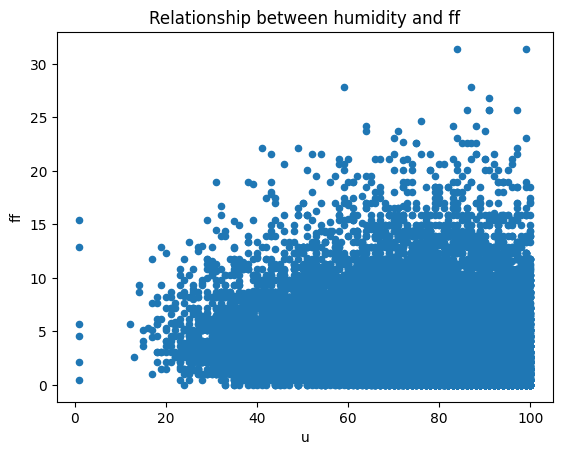

...

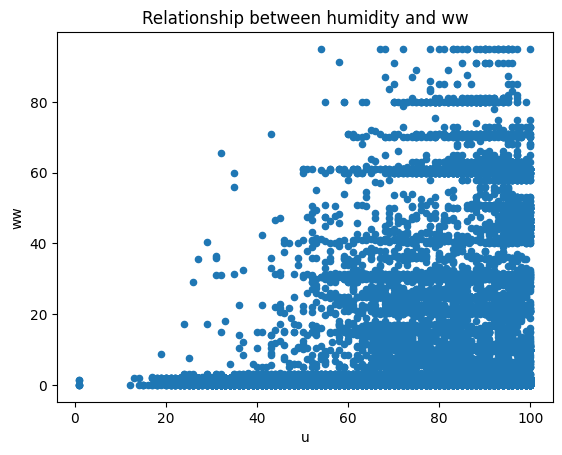

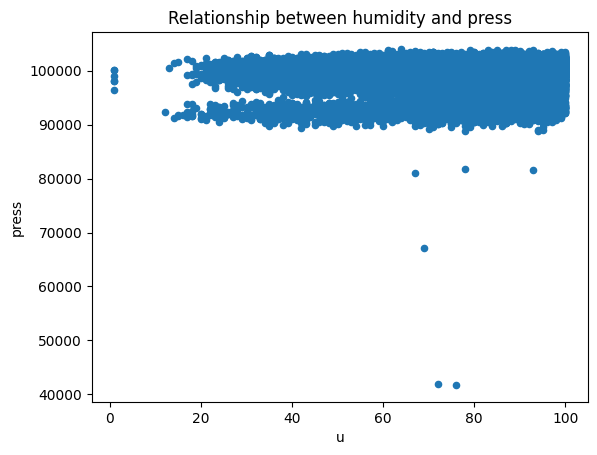

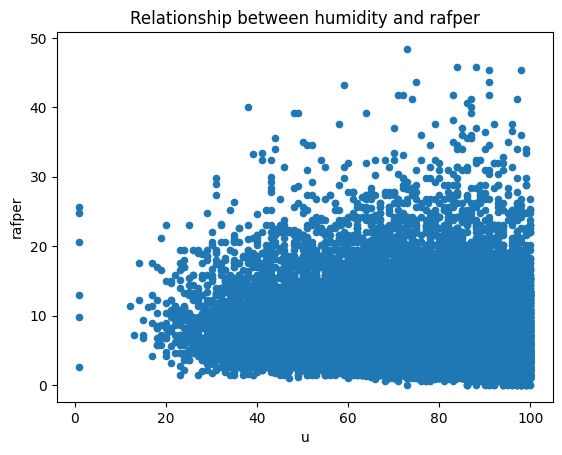

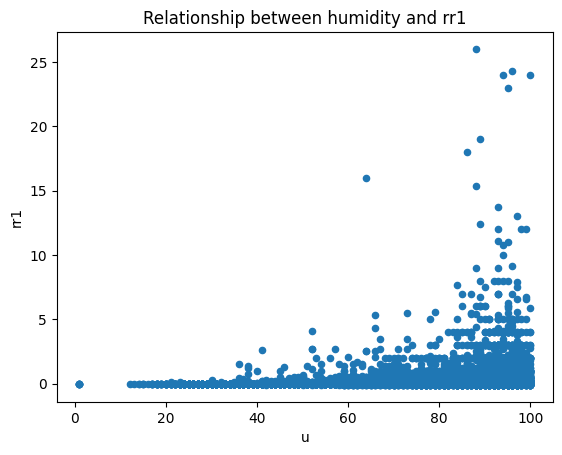

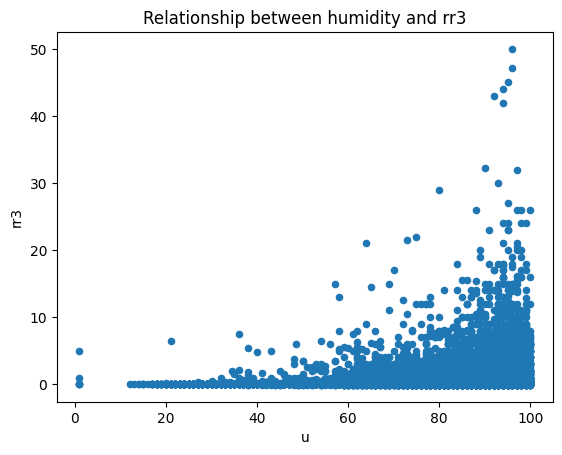

In [ ]:
features = [
    "pmer",
    "tend",
    "cod_tend",
    "dd",
    "ff",
    "td",
    "ww",
    "press",
    "rafper",
    "rr1",
    "rr3",
]

for feature in features:
    df.plot(kind='scatter', x='u', y=feature)
    plt.title(f'Relationship between humidity and {feature}')
    plt.xlabel('u')
    plt.ylabel(feature)
    plt.show()

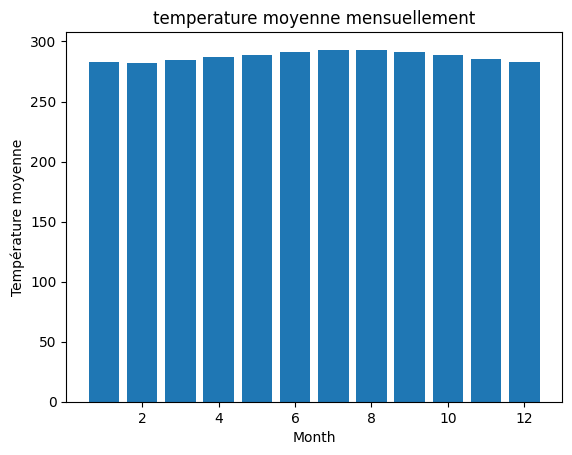

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Convertir la colonne 'time' en type datetime
df['date'] = pd.to_datetime(df['date'])

# Grouper les données par mois et calculer la température moyenne
monthly_data = df.groupby(df['date'].dt.month).mean(numeric_only=True)

# Créer un diagramme en bâtons
plt.bar(monthly_data.index, monthly_data['tc'])
plt.title('temperature moyenne mensuellement')
plt.xlabel('Month')
plt.ylabel('Température moyenne')
plt.show()

# Create a bar chart to show le Top 10 des températures avec les vitesses de vent les plus élevées

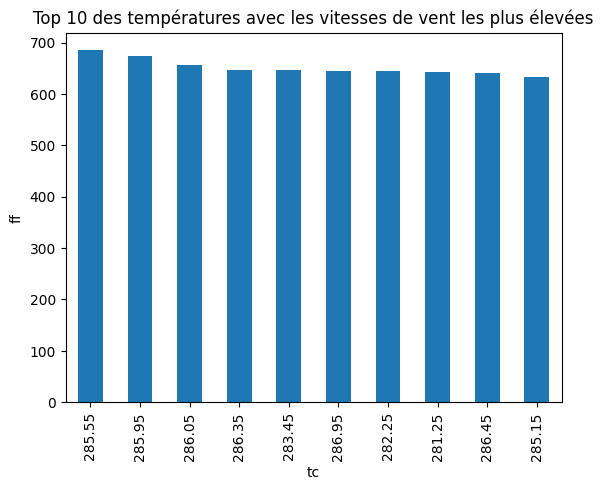

In [ ]:
top_publishers = df.groupby('tc')['ff'].sum().nlargest(10)

top_publishers.plot(kind='bar')
plt.title('Top 10 des températures avec les vitesses de vent les plus élevées')
plt.xlabel('tc')
plt.ylabel('ff')
plt.show()

# 4- Use XGBoost as your machine learning algorithm for weather prediction.

In [ ]:
!pip install XGBoost

In [ ]:
import xgboost as xgb
from sklearn.model_selection import train_test_split

In [ ]:
X = df.drop(['date', 'tc'], axis=1)
y = df['tc']

In [ ]:
# Diviser les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [ ]:
# Créer un objet DMatrix à partir des ensembles d'entraînement et de test
dtrain = xgb.DMatrix(X_train, label=y_train)
dtest = xgb.DMatrix(X_test, label=y_test)

In [ ]:
# Définir les hyperparamètres pour le modèle XGBoost
params = {
    'learning_rate': 0.1,
    'max_depth': 3,
    'subsample': 0.8,
    'colsample_bytree': 0.8,
    'objective': 'reg:squarederror'
}

In [ ]:
# validation croisée 5-fold avec différentes valeurs de num_boost_round
cv_results = xgb.cv(
    params=params,
    dtrain=dtrain,
    num_boost_round=100,
    nfold=5,
    metrics='rmse',
    early_stopping_rounds=10
)

print(cv_results)

    train-rmse-mean  train-rmse-std  test-rmse-mean  test-rmse-std
0        258.688730        0.014006      258.687478       0.060597
1        232.849664        0.012418      232.848938       0.059562
2        209.580314        0.009861      209.579334       0.054953
3        188.642310        0.016666      188.641242       0.045137
4        169.791165        0.014845      169.789824       0.042971
..              ...             ...             ...            ...
95         1.001014        0.023149        1.056763       0.098885
96         0.997731        0.023113        1.053589       0.099793
97         0.994231        0.023342        1.050195       0.099683
98         0.991460        0.023600        1.047628       0.100136
99         0.988739        0.023368        1.045550       0.100597

[100 rows x 4 columns]


# on peut voir que l’erreur RMSE moyenne pour l’ensemble de test diminue à chaque itération de boosting, ce qui indique que le modèle s’améliore au fil des itérations. La dernière ligne du DataFrame montre que l’erreur RMSE moyenne pour l’ensemble de test est d’environ 1.045550  après 100 itérations de boosting.

In [ ]:
# recherche sur grille avec un modèle XGBoost :
from sklearn.model_selection import GridSearchCV

# Définir l'espace de recherche les hyperparamètres
param_grid = {
    'learning_rate': [0.1, 0.01, 0.001],
    'max_depth': [3, 6, 9],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0],
}

# Créer un objet XGBRegressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100)

# Effectuer une recherche sur grille pour trouver les meilleurs hyperparamètres
grid_search = GridSearchCV(estimator=xgb_reg, param_grid=param_grid, cv=5)
grid_search.fit(X_train, y_train)

# Afficher les meilleurs hyperparamètres trouvés par la recherche sur grille
print(grid_search.best_params_)

{'colsample_bytree': 0.9, 'learning_rate': 0.1, 'max_depth': 9, 'subsample': 0.9}


# 5-Train your XGBoost model using the preprocessed data.

In [ ]:
# Définir les hyperparamètres pour le modèle XGBoost
params = {
    'learning_rate': 0.1,
    'max_depth': 9,
    'subsample': 0.9,
    'colsample_bytree': 0.9,
    'objective': 'reg:squarederror'
}

In [ ]:
# Entraîner le modèle XGBoost en utilisant la méthode train() de l'objet Booster
model = xgb.train(params=params, dtrain=dtrain, num_boost_round=100)

# 6- Evaluate the performance of your XGBoost model using various metrics such as accuracy, precision, recall, and F1-score.

In [ ]:
# Évaluer les performances du modèle sur l'ensemble de test
y_pred = model.predict(dtest)

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score

rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

print(f'Test RMSE: {rmse:.2f}')
print(f'Test R^2: {r2:.2f}')

Test RMSE: 0.90
Test R^2: 0.99


# les résultats du modèle XGBoost indiquent des performances exceptionnelles sur l’ensemble de test, avec une erreur RMSE de 0,90 et un score R^2 de 0,99. Ces valeurs suggèrent que le modèle est capable de prédire la température avec une grande précision.


# Vérification si le modèle est surajusté, en utilisantla validation croisée pour évaluer ses performances sur plusieurs partitions des données

In [ ]:
from sklearn.model_selection import cross_val_score
import numpy as np

# Sélectionner les caractéristiques et la variable cible
X = df.drop(['date', 'tc'], axis=1)
y = df['tc']

# Créer un modèle XGBoost
model = xgb.XGBRegressor(objective='reg:squarederror')

# Évaluer les performances du modèle à l'aide de la validation croisée
scores = cross_val_score(model, X, y, cv=5, scoring='neg_mean_squared_error')

# Calculer la RMSE moyenne
rmse = np.sqrt(-scores.mean())

print(f'Cross-validation RMSE: {rmse:.2f}')

Cross-validation RMSE: 1.30


# 7- Store the weather data in an SQLite database for future use.

In [ ]:
import sqlite3
from pandas.io import sql

# Créer une connexion à la base de données SQLite
conn = sqlite3.connect('weather.db')

# Stocker les données du DataFrame dans la base de données
sql.to_sql(df, name='weather_data', con=conn, index=False, if_exists='replace')

# Fermer la connexion à la base de données
conn.close()

In [ ]:
import sqlite3
from pandas.io import sql

# Créer une connexion à la base de données SQLite
conn = sqlite3.connect('weather.db')

# Récupérer les données de la table 'weather_data'
df = sql.read_sql_query('SELECT * FROM weather_data', con=conn)

# Fermer la connexion à la base de données
conn.close()